In [119]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import metrics
import seaborn as sns
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

In [120]:
data = pd.read_csv("credit_card.csv")
data['CUST_ID'] = data['CUST_ID'].str.replace('C1', '', regex=False)
data['CUST_ID'] = data['CUST_ID'].astype(int)

In [121]:
mean1 = data['CREDIT_LIMIT'].mean()
data['CREDIT_LIMIT'] = data['CREDIT_LIMIT'].fillna(mean1)

In [122]:
mean2 = data['MINIMUM_PAYMENTS'].mean()
data['MINIMUM_PAYMENTS'] = data['MINIMUM_PAYMENTS'].fillna(mean2)

In [123]:
#data = data.iloc[:, 1:].values

In [124]:
inertia = []
k_max=1;

for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(data)
    if( k>1 and kmeans.inertia_ < max(inertia)):
        k_max=k
    inertia.append(kmeans.inertia_)

k_max

10

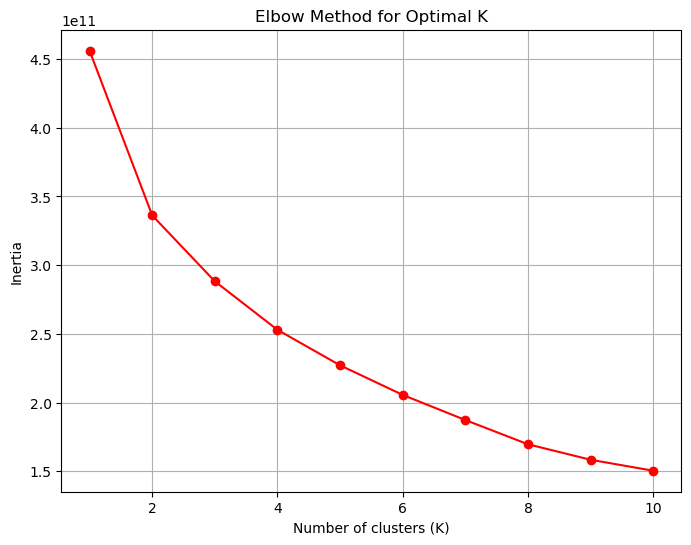

In [125]:
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), inertia, marker='o', linestyle='-', color='r')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Inertia')
plt.grid(True)
plt.show()

In [126]:
kmeans = KMeans(n_clusters=10, random_state=0)

kmeans.fit(data)

data['Cluster'] = kmeans.labels_

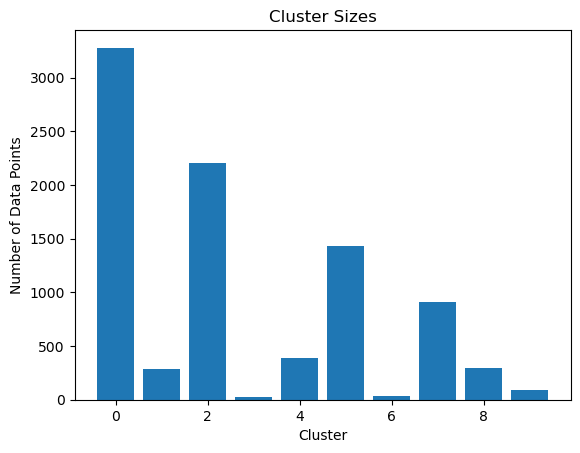

In [127]:
cluster_sizes = data['Cluster'].value_counts()
plt.bar(cluster_sizes.index, cluster_sizes.values)
plt.xlabel('Cluster')
plt.ylabel('Number of Data Points')
plt.title('Cluster Sizes')
plt.show()

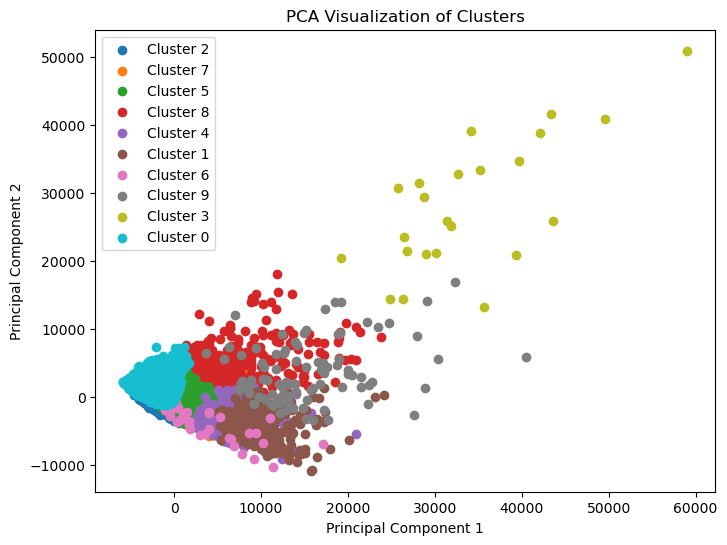

In [128]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
data_pca = pca.fit_transform(data.drop('Cluster', axis=1))

plt.figure(figsize=(8, 6))
for cluster in data['Cluster'].unique():
    subset = data_pca[data['Cluster'] == cluster]
    plt.scatter(subset[:, 0], subset[:, 1], label=f'Cluster {cluster}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA Visualization of Clusters')
plt.legend()
plt.show()

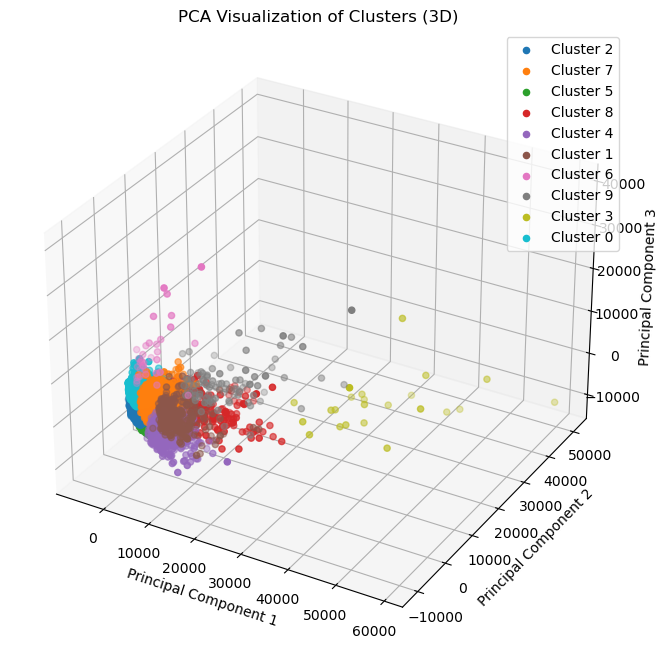

In [129]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  

pca = PCA(n_components=3)
data_pca = pca.fit_transform(data.drop('Cluster', axis=1))

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')  

for cluster in data['Cluster'].unique():
    subset = data_pca[data['Cluster'] == cluster]
    ax.scatter(subset[:, 0], subset[:, 1], subset[:, 2], label=f'Cluster {cluster}')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('PCA Visualization of Clusters (3D)')
ax.legend()
plt.show()

In [137]:
data['CREDIT_LIMIT'].isnull().sum() 

0

In [138]:
mean2 = data['MINIMUM_PAYMENTS'].mean()
data['MINIMUM_PAYMENTS'] = data['MINIMUM_PAYMENTS'].fillna(mean2)

In [139]:
data['MINIMUM_PAYMENTS'].isnull().sum() 

0

In [140]:
for column in data.columns:
    print(column, data[column].isnull().sum())

CUST_ID 0
BALANCE 0
BALANCE_FREQUENCY 0
PURCHASES 0
ONEOFF_PURCHASES 0
INSTALLMENTS_PURCHASES 0
CASH_ADVANCE 0
PURCHASES_FREQUENCY 0
ONEOFF_PURCHASES_FREQUENCY 0
PURCHASES_INSTALLMENTS_FREQUENCY 0
CASH_ADVANCE_FREQUENCY 0
CASH_ADVANCE_TRX 0
PURCHASES_TRX 0
CREDIT_LIMIT 0
PAYMENTS 0
MINIMUM_PAYMENTS 0
PRC_FULL_PAYMENT 0
TENURE 0


In [141]:
data['CUST_ID'] = data['CUST_ID'].str.replace('C1', '', regex=False)
data['CUST_ID'] = data['CUST_ID'].astype(int)

In [142]:
data.head(8950)

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,1,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.000000,201.802084,139.509787,0.000000,12
1,2,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.000000,4103.032597,1072.340217,0.222222,12
2,3,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.000000,622.066742,627.284787,0.000000,12
3,4,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.000000,0.000000,864.206542,0.000000,12
4,5,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.000000,678.334763,244.791237,0.000000,12
5,6,1809.828751,1.000000,1333.28,0.00,1333.28,0.000000,0.666667,0.000000,0.583333,0.000000,0,8,1800.000000,1400.057770,2407.246035,0.000000,12
6,7,627.260806,1.000000,7091.01,6402.63,688.38,0.000000,1.000000,1.000000,1.000000,0.000000,0,64,13500.000000,6354.314328,198.065894,1.000000,12
7,8,1823.652743,1.000000,436.20,0.00,436.20,0.000000,1.000000,0.000000,1.000000,0.000000,0,12,2300.000000,679.065082,532.033990,0.000000,12
8,9,1014.926473,1.000000,861.49,661.49,200.00,0.000000,0.333333,0.083333,0.250000,0.000000,0,5,7000.000000,688.278568,311.963409,0.000000,12
9,10,152.225975,0.545455,1281.60,1281.60,0.00,0.000000,0.166667,0.166667,0.000000,0.000000,0,3,11000.000000,1164.770591,100.302262,0.000000,12


In [143]:
data2 = data.drop('CUST_ID', axis=1)

In [144]:
indexwala = data['CUST_ID'].to_numpy()  

In [145]:
print(indexwala.tolist())

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 67, 68, 69, 70, 71, 72, 73, 74, 75, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 226, 227, 228, 229

In [146]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
data2 = scaler.fit_transform(data2)
np.set_printoptions(suppress=True)
data2

array([[-0.73198937, -0.24943448, -0.42489974, ..., -0.31096755,
        -0.52555097,  0.36067954],
       [ 0.78696085,  0.13432467, -0.46955188, ...,  0.08931021,
         0.2342269 ,  0.36067954],
       [ 0.44713513,  0.51808382, -0.10766823, ..., -0.10166318,
        -0.52555097,  0.36067954],
       ...,
       [-0.7403981 , -0.18547673, -0.40196519, ..., -0.33546549,
         0.32919999, -4.12276757],
       [-0.74517423, -0.18547673, -0.46955188, ..., -0.34690648,
         0.32919999, -4.12276757],
       [-0.57257511, -0.88903307,  0.04214581, ..., -0.33294642,
        -0.52555097, -4.12276757]])

In [147]:
 data_final = np.column_stack((indexwala, data2))

In [148]:
data_final

array([[   1.        ,   -0.73198937,   -0.24943448, ...,   -0.31096755,
          -0.52555097,    0.36067954],
       [   2.        ,    0.78696085,    0.13432467, ...,    0.08931021,
           0.2342269 ,    0.36067954],
       [   3.        ,    0.44713513,    0.51808382, ...,   -0.10166318,
          -0.52555097,    0.36067954],
       ...,
       [9188.        ,   -0.7403981 ,   -0.18547673, ...,   -0.33546549,
           0.32919999,   -4.12276757],
       [9189.        ,   -0.74517423,   -0.18547673, ...,   -0.34690648,
           0.32919999,   -4.12276757],
       [9190.        ,   -0.57257511,   -0.88903307, ...,   -0.33294642,
          -0.52555097,   -4.12276757]])

In [149]:
import random
class kmc: #k means clustering hay
    def __init__(self,n_clusters=2,max_iter=100):
        self.n_clusters = n_clusters
        self.max_iter = max_iter
        self.centroids = None

    def fit_predict(self,X):

        random_index = random.sample(range(0,X.shape[0]),self.n_clusters)
        self.centroids = X[random_index]

        for i in range(self.max_iter):
            cluster_group = self.assign_clusters(X)
            old_centroids = self.centroids
            self.centroids = self.move_centroids(X,cluster_group)
            if (old_centroids == self.centroids).all():
                break

        return cluster_group

    def assign_clusters(self,X):
        cluster_group = []
        distances = []

        for row in X:
            for centroid in self.centroids:
                distances.append(np.sqrt(np.dot(row-centroid,row-centroid)))
            min_distance = min(distances)
            index_pos = distances.index(min_distance)
            cluster_group.append(index_pos)
            distances.clear()

        return np.array(cluster_group)

    def move_centroids(self,X,cluster_group):
        new_centroids = []

        cluster_type = np.unique(cluster_group)

        for type in cluster_type:
            new_centroids.append(X[cluster_group == type].mean(axis=0))

        return np.array(new_centroids)

In [150]:
kmeans = kmc(n_clusters=2, max_iter=100)
cluster_assignments = kmeans.fit_predict(data_final)
print("Cluster Assignments:", cluster_assignments)

Cluster Assignments: [0 0 0 ... 1 1 1]


In [151]:
print("Centroids:", kmeans.centroids)

Centroids: [[2306.06184416    0.19596464    0.09716975    0.11494223    0.11261937
     0.06458597    0.07286946    0.02426182    0.14461598   -0.01752905
     0.02188686    0.01604746    0.09476824    0.29418173    0.14039321
     0.05219274   -0.03265306    0.12878286]
 [6898.1241333    -0.19631529   -0.09734362   -0.1151479    -0.11282088
    -0.06470153   -0.07299985   -0.02430523   -0.14487474    0.01756041
    -0.02192603   -0.01607617   -0.09493781   -0.29470811   -0.14064442
    -0.05228613    0.03271149   -0.12901329]]


In [152]:
inertia = []
k_max = 1

for k in range(1, 11):
    kmeans = kmc(n_clusters=k, max_iter=100)
    cluster_assignments = kmeans.fit_predict(data_final)
    if k > 1 and (np.sum((data_final - kmeans.centroids[cluster_assignments]) ** 2) < max(inertia)):
        k_max = k
    inertia.append(np.sum((data_final - kmeans.centroids[cluster_assignments]) ** 2))

print("Optimal K (number of clusters):", k_max)


Optimal K (number of clusters): 10


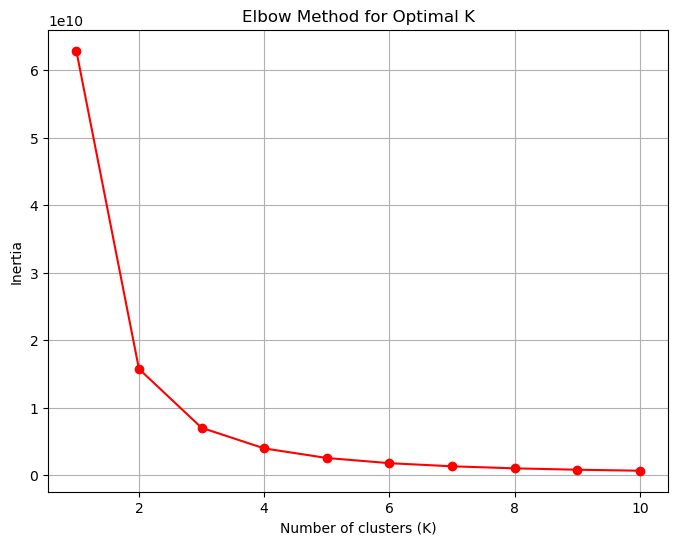

In [153]:
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), inertia, marker='o', linestyle='-', color='r')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Inertia')
plt.grid(True)
plt.show()